### Import the necessary pacakages

In [3]:
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable


In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
#%matplotlib inline
import pandas_profiling
pd.set_option('display.max_rows', None) # This is used to display all the rows in the dataset although it is not advisable in the case of a very large data

<ipython-input-5-6ef51de3243c>:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [7]:
# To load the dataset
Census = "census03.csv"
Census_df = pd.read_csv(r"census03.csv")

In [8]:
# To view the first 5 rows of the dataset
Census_df.head()

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired Retail banker,None,Christian


In [9]:
# To rename the columns there by removing the unwanted spaces in between the column names
Census_df.columns = Census_df.columns.str.replace(" ", "_")

In [10]:
# Check to see the effected change in the column names
Census_df.head()    

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired Retail banker,None,Christian


### EXPLORING THE DATA FOR ANALYSIS

In [11]:
# Selecting random rows to check contents. This returns different rows when run
Census_df.sample(8)

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
299,55,Andrews Avenue,Amber,Evans,5,Daughter,NaN,Female,Student,None,NaN
761,18,Hawthorn Knolls,Kim,Hughes,20,Head,Married,Female,University Student,None,Christian
6203,35,Ahmed Oval,Philip,Payne,16,Son,NaN,Male,Student,None,NaN
3759,5,Grape Streets,Lydia,Archer,56,Head,Single,Female,Waste management officer,None,Christian
9631,5,Ranger Road,Joshua,Page,74,Husband,Married,Male,Retired Recruitment consultant,None,Christian
9557,22,August Street,Geoffrey,Harris,54,Husband,Married,Male,Operational researcher,None,None
1877,22,ExcaliburBells Heights,Christian,Green,53,Partner,Single,Male,Geoscientist,None,None
4396,84,Shepherd Cove,Joel,McDonald,0,Son,NaN,Male,Child,None,NaN


In [12]:
# To check the dimension of our data
Census_df.shape

(10083, 11)

- The Census 03 data contains 10,083 rows and 11 columns in the dataset

In [13]:
# To check the data types comprehensively
Census_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10083 entries, 0 to 10082
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   House_Number                   10083 non-null  int64 
 1   Street                         10083 non-null  object
 2   First_Name                     10083 non-null  object
 3   Surname                        10083 non-null  object
 4   Age                            10083 non-null  object
 5   Relationship_to_Head_of_House  10083 non-null  object
 6   Marital_Status                 7526 non-null   object
 7   Gender                         10083 non-null  object
 8   Occupation                     10083 non-null  object
 9   Infirmity                      10083 non-null  object
 10  Religion                       7463 non-null   object
dtypes: int64(1), object(10)
memory usage: 866.6+ KB


- From observation, we have all columns to be object data type except for house number that is a type integer 

In [14]:
# Checking for missing values
Census_df.isnull().sum()

House_Number                        0
Street                              0
First_Name                          0
Surname                             0
Age                                 0
Relationship_to_Head_of_House       0
Marital_Status                   2557
Gender                              0
Occupation                          0
Infirmity                           0
Religion                         2620
dtype: int64

- In this Census03 data, there are:
    - 2557 missing values for Marital Status
    - 2620 missing values for Religion

In [15]:
# To get some descriptive statistics. by default, the method .describe returns only numeric values unless we pass an arguement (include = 'all') then it shows both the numeric and non numeric together
Census_df.describe(include = 'all')

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
count,10083.000000,10083,10083,10083,10083,10083,7526,10083,10083,10083,7463
unique,NaN,104,365,695,124,21,4,2,1079,8,15
top,NaN,Lightning Street,Clare,Smith,19,Head,Single,Female,Student,None,None
freq,NaN,1498,43,325,188,3131,3656,5267,2040,9995,3363
mean,46.840920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,53.003405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,11.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,25.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,57.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
def composition(Census_df_in, feature):
    key = {}
    composed = {}
    for r in Census_df_in[feature]:
        composed[r] = round((Census_df_in[Census_df_in[feature] == r]['Age'].notnull().sum()/10083)*100,2)
    #return composed
    for k, v in composed.items():
        print(f'{k} : {v}%')

### Pre-processing the Data
- The aim of pre-processing the data is to fix any problem in the features of the data

#### Age Column: 
- This is supposed to  be an integer or float, why is it of the type object?
- At what rows did this error occur?

In [17]:
# Print out the Age column
Census_df['Age']

0                        50
1                        21
2                        58
3                        50
4                        79
5                        62
6                        63
7                        50
8                        35
9                        29
10                       45
11                       43
12                       58
13                       54
14                       44
15                       52
16                       17
17                       16
18                       14
19                        8
20                       23
21                        1
22                       24
23                       38
24                       40
25                       41
26                        5
27                        2
28                        1
29                       40
30                       41
31                       12
32                        9
33                       61
34                       26
35                  

In [18]:
# On skimming through the ages, i can see that the data type floats and integers are contained in the age column. The data type here will be changed to float as its more covenient since float has more precedence compared to integer.
for num in Census_df['Age']:
     age = float(num)
     print(age)

50.0
21.0
58.0
50.0
79.0
62.0
63.0
50.0
35.0
29.0
45.0
43.0
58.0
54.0
44.0
52.0
17.0
16.0
14.0
8.0
23.0
1.0
24.0
38.0
40.0
41.0
5.0
2.0
1.0
40.0
41.0
12.0
9.0
61.0
26.0
53.0
43.0
61.0
42.0
43.0
15.0
13.0
43.0
51.0
16.0
22.0
23.0
2.0
1.0
58.0
58.0
40.0
40.0
29.0
1.0
27.0
43.0
49.0
15.0
12.0
9.0
5.0
55.0
21.0
21.0
18.0
16.0
49.0
54.0
25.0
23.0
19.0
17.0
42.0
42.0
16.0
12.0
44.0
22.0
20.0
18.0
34.0
62.0
40.0
47.0
25.0
39.0
37.0
17.0
13.0
27.0
52.0
30.0
65.0
70.0
41.0
37.0
32.0
28.0
59.0
57.0
19.0
17.0
37.0
37.0
20.0
17.0
47.0
52.0
48.0
53.0
12.0
10.0
35.0
39.0
1.0
0.0
71.0
43.0
34.0
30.0
31.0
44.0
48.0
13.0
11.0
17.0
0.0
47.0
41.0
50.0
52.0
30.0
14.0
36.0
4.0
44.0
44.0
46.0
1.0
43.0
57.0
60.0
24.0
9.0
47.0
29.0
35.0
3.0
34.0
19.0
56.0
35.0
35.0
15.0
55.0
18.0
18.0
18.0
41.0
11.0
8.0
1.0
54.0
56.0
13.0
10.0
69.0
72.0
24.0
21.0
17.0
24.0
26.0
50.0
16.0
56.0
56.0
49.0
16.0
10.0
39.0
5.0
2.0
46.0
48.0
19.0
15.0
14.0
34.0
31.0
34.0
36.0
15.0
68.0
67.0
55.0
61.0
63.0
10.0
70.0
57.0
17.0
15.0
89

ValueError: could not convert string to float: ''

- From the above, it can be seen that even though most of the ages was converted to float, we encountered an error because the age column contains some empty strings (' ') which of course cannot be converted as we can see from the error message above.

In [19]:
# To check for the errors in the Age column and the rows where the errors occurred
for row_num, num in enumerate(Census_df['Age']):
    try:
        age = float(num)
        
    except Exception as error:
        print(f"{error} in {row_num}")

could not convert string to float: '' in 756
could not convert string to float: '' in 3389


- From the above, two empty strings was encountered in the Age column in row number 756 and 3389 which is impossible to cast to float

In [20]:
# To check other features related to the age empty strings before replacing with nan
Census_df[Census_df['Age']== " "]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
756,15,Hawthorn Knolls,Nicola,Anderson,,Wife,Married,Female,Automotive engineer,None,Methodist
3389,209,Lightning Street,Duncan,Hammond,,Son,Divorced,Male,"Scientist, water quality",None,Christian


In [21]:
# To replace the empty entries in Age 
Census_df['Age'].replace([' '], [np.nan], inplace = True)

In [22]:
#  This will not print out anything as its just to check if the empty entries in Age has been replaced with nan
for row_num, num in enumerate(Census_df['Age']):
    try:
        age = float(num)
        
    except Exception as error:
        print(f"{error} in {row_num}")

In [23]:
# converting the data type of Age to its appropriate data type
Census_df['Age'] = Census_df['Age'].astype(float)

In [24]:
# Checking for missing  values in the Age column
Census_df['Age'].isnull().sum()

2

In [25]:
# To fill in the missing value, the mean of the ages will be used.
Census_df['Age'].describe()

count    10081.000000
mean        34.728843
std         21.483870
min          0.000000
25%         17.000000
50%         34.000000
75%         50.000000
max        111.000000
Name: Age, dtype: float64

- It can be seen that the marital status of the empty values in the Age column are both married and divorced so i can comfortably replace with the median as explained below

In [26]:
# The median was used to fill the missing values instead of the mean because the mean value is higher than the median. This high value of the mean value is as a result of outliers
Census_df['Age'].fillna(value=Census_df['Age'].median(), inplace = True)

In [27]:
# To check
Census_df['Age'].isnull().sum()

0

In [28]:
# Rounding up the ages using the Lambda function since the universal measurement of age is in years./ So newly born will be assigned age 0 till they are upto to a year according to this data
Census_df['Age'] = Census_df['Age'].apply(lambda x:round(x))

In [29]:
# To check
Census_df['Age']

0         50
1         21
2         58
3         50
4         79
5         62
6         63
7         50
8         35
9         29
10        45
11        43
12        58
13        54
14        44
15        52
16        17
17        16
18        14
19         8
20        23
21         1
22        24
23        38
24        40
25        41
26         5
27         2
28         1
29        40
30        41
31        12
32         9
33        61
34        26
35        53
36        43
37        61
38        42
39        43
40        15
41        13
42        43
43        51
44        16
45        22
46        23
47         2
48         1
49        58
50        58
51        40
52        40
53        29
54         1
55        27
56        43
57        49
58        15
59        12
60         9
61         5
62        55
63        21
64        21
65        18
66        16
67        49
68        54
69        25
70        23
71        19
72        17
73        42
74        42
75        16
76        12

### Infirmity Column

In [30]:
# To check the unique values in Infirmity
Census_df['Infirmity'].unique()

array(['None', 'Physical Disability', ' ', 'Deaf', 'Unknown Infection',
       'Disabled', 'Blind', 'Mental Disability'], dtype=object)

In [31]:
# To check the sum of nan values in Infirmity
Census_df['Infirmity'].isnull().sum()

0

In [32]:
# To check for empty strings in the Infirmity column
Census_df[Census_df['Infirmity']== ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
702,5,Lynch Spurs,Hollie,Rees,16,Granddaughter,NaN,Female,Student,,NaN
1758,17,Roberts Divide,Victoria,Francis,45,Head,Single,Female,Art gallery manager,,None
1794,28,Roberts Divide,Leon,Conway,59,Husband,Married,Male,Learning disability nurse,,Christian
2243,41,Lightning Street,Iain,Johnson,32,Son,Single,Male,"Surveyor, insurance",,Christian
2978,148,Lightning Street,Molly,Lambert,26,Daughter,Single,Female,Radio broadcast assistant,,Christian
3646,6,Plymouth Drive,Lewis,Akhtar,29,None,Single,Male,PhD Student,,Buddist
4000,18,Shepherd Cove,Lynda,Bruce,29,Daughter,Single,Female,Facilities manager,,Catholic
4675,131,Shepherd Cove,Rita,Akhtar,10,Granddaughter,NaN,Female,Student,,NaN
4821,153,Shepherd Cove,Robin,Fleming,22,Lodger,Divorced,Male,University Student,,None
7789,22,Khan Keys,Sharon,Jackson,59,Head,Married,Female,Clothing/textile technologist,,None


In [33]:
Census_df['Infirmity'].unique()

array(['None', 'Physical Disability', ' ', 'Deaf', 'Unknown Infection',
       'Disabled', 'Blind', 'Mental Disability'], dtype=object)

In [34]:
Census_df['Infirmity'].value_counts()

None                   9995
Physical Disability      30
                         13
Deaf                     12
Unknown Infection        10
Mental Disability        10
Disabled                  8
Blind                     5
Name: Infirmity, dtype: int64

In [35]:
# Replacing the empty strings to the most occuring(mode)
Census_df['Infirmity'] = Census_df['Infirmity'].replace(" ", 'None')

In [36]:
# To check 
Census_df[Census_df['Infirmity']== ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


### Relationship_to_Head_of_House:

In [37]:
# To check for unique entries in the Head of House features
Census_df['Relationship_to_Head_of_House'].value_counts()

Head                     3131
Son                      1878
Daughter                 1875
Husband                   958
None                      659
Lodger                    559
Wife                      311
Partner                   273
Grandson                   99
Granddaughter              87
Sibling                    67
Cousin                     53
Visitor                    33
Nephew                     19
Step-Daughter              17
Neice                      17
Adopted Daughter           16
Step-Son                   13
Adopted Son                13
Adopted Grandson            4
Adopted Granddaughter       1
Name: Relationship_to_Head_of_House, dtype: int64

In [38]:
# Changing str 'Neice' to 'Niece'
Census_df['Relationship_to_Head_of_House'] = Census_df['Relationship_to_Head_of_House'].replace(['Neice'], 'Niece')

In [39]:
# To check the sum of the nan values in the Relationship_to_Head_of_House
Census_df['Relationship_to_Head_of_House'].isnull().sum()

0

In [40]:
# To check for empty strings in the Relationship_to_Head_of_House column
Census_df[Census_df['Relationship_to_Head_of_House']== ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [41]:
Census_df['Relationship_to_Head_of_House'].describe()

count     10083
unique       21
top        Head
freq       3131
Name: Relationship_to_Head_of_House, dtype: object

In [42]:
composition(Census_df, 'Relationship_to_Head_of_House')

Head : 31.05%
Wife : 3.08%
Partner : 2.71%
Sibling : 0.66%
Lodger : 5.54%
Husband : 9.5%
Daughter : 18.6%
Son : 18.63%
Visitor : 0.33%
Cousin : 0.53%
Adopted Son : 0.13%
None : 6.54%
Granddaughter : 0.86%
Grandson : 0.98%
Adopted Granddaughter : 0.01%
Step-Son : 0.13%
Adopted Daughter : 0.16%
Step-Daughter : 0.17%
Adopted Grandson : 0.04%
Niece : 0.17%
Nephew : 0.19%


### Marital Status Column:

In [43]:
# To check for unique entries in the marital status features
Census_df['Marital_Status'].unique()

array(['Single', 'Married', 'Widowed', nan, 'Divorced'], dtype=object)

In [44]:
# To check for empty strings
Census_df[Census_df['Marital_Status'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [45]:
# Count of unique Marital_Status
Census_df['Marital_Status'].value_counts()

Single      3656
Married     2552
Divorced     972
Widowed      346
Name: Marital_Status, dtype: int64

In [46]:
# To check for total null values in Marital Status
Census_df['Marital_Status'].isnull().sum()

2557

In [47]:
# Check Marital Status column for missing values noting the rows where it occured
Census_df[Census_df['Marital_Status'].isnull()]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
16,2,Bletchleyrow Street,Lynn,Jones,17,Daughter,NaN,Female,Student,None,NaN
17,2,Bletchleyrow Street,Joshua,Jones,16,Son,NaN,Male,Student,None,NaN
18,2,Bletchleyrow Street,Ruth,Jones,14,Daughter,NaN,Female,Student,None,NaN
19,2,Bletchleyrow Street,Abbie,Jones,8,Daughter,NaN,Female,Student,None,NaN
21,3,Bletchleyrow Street,Stacey,Field-Webb,1,Daughter,NaN,Female,Child,None,NaN
26,4,Bletchleyrow Street,Glen,Young,5,Son,NaN,Male,Student,None,NaN
27,4,Bletchleyrow Street,Damien,Young,2,Son,NaN,Male,Child,None,NaN
28,4,Bletchleyrow Street,Conor,Young,1,Son,NaN,Male,Child,None,NaN
31,5,Bletchleyrow Street,Dean,Ford-Ali,12,Son,NaN,Male,Student,None,NaN
32,5,Bletchleyrow Street,Sara,Ford-Ali,9,Daughter,NaN,Female,Student,None,NaN


In [48]:
# To check for nan values in Marital_Status for ages less than or equal to 17 years(Not legally allowed to marry)
Census_df[(Census_df['Age'] <= 17) & (Census_df['Marital_Status'].isnull())]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
16,2,Bletchleyrow Street,Lynn,Jones,17,Daughter,NaN,Female,Student,None,NaN
17,2,Bletchleyrow Street,Joshua,Jones,16,Son,NaN,Male,Student,None,NaN
18,2,Bletchleyrow Street,Ruth,Jones,14,Daughter,NaN,Female,Student,None,NaN
19,2,Bletchleyrow Street,Abbie,Jones,8,Daughter,NaN,Female,Student,None,NaN
21,3,Bletchleyrow Street,Stacey,Field-Webb,1,Daughter,NaN,Female,Child,None,NaN
26,4,Bletchleyrow Street,Glen,Young,5,Son,NaN,Male,Student,None,NaN
27,4,Bletchleyrow Street,Damien,Young,2,Son,NaN,Male,Child,None,NaN
28,4,Bletchleyrow Street,Conor,Young,1,Son,NaN,Male,Child,None,NaN
31,5,Bletchleyrow Street,Dean,Ford-Ali,12,Son,NaN,Male,Student,None,NaN
32,5,Bletchleyrow Street,Sara,Ford-Ali,9,Daughter,NaN,Female,Student,None,NaN


### To get total ages of nan values <= 17. It is observed that all nan values in Marital Status is less than the legal age for marriage

In [49]:
# Filling the Marital Status of those <= 17 years whose status is nan with Minors because they are less than the legal marriage age
Census_df.loc[(Census_df['Age'] <= 17) & (Census_df['Marital_Status'].isnull()),:] = Census_df.loc[(Census_df['Age'] <= 17) & (Census_df['Marital_Status'].isnull()),:].fillna(value = {'Marital_Status': 'Minors'}) 

In [50]:
# To Check if the null values in marriage has been replaced
Census_df[Census_df['Marital_Status'].isnull()]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [51]:
# To check if the changes has been effected to Minors
Census_df[Census_df['Marital_Status'] == "Minors"]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
16,2,Bletchleyrow Street,Lynn,Jones,17,Daughter,Minors,Female,Student,None,NaN
17,2,Bletchleyrow Street,Joshua,Jones,16,Son,Minors,Male,Student,None,NaN
18,2,Bletchleyrow Street,Ruth,Jones,14,Daughter,Minors,Female,Student,None,NaN
19,2,Bletchleyrow Street,Abbie,Jones,8,Daughter,Minors,Female,Student,None,NaN
21,3,Bletchleyrow Street,Stacey,Field-Webb,1,Daughter,Minors,Female,Child,None,NaN
26,4,Bletchleyrow Street,Glen,Young,5,Son,Minors,Male,Student,None,NaN
27,4,Bletchleyrow Street,Damien,Young,2,Son,Minors,Male,Child,None,NaN
28,4,Bletchleyrow Street,Conor,Young,1,Son,Minors,Male,Child,None,NaN
31,5,Bletchleyrow Street,Dean,Ford-Ali,12,Son,Minors,Male,Student,None,NaN
32,5,Bletchleyrow Street,Sara,Ford-Ali,9,Daughter,Minors,Female,Student,None,NaN


In [52]:
Census_df['Marital_Status'].describe()

count      10083
unique         5
top       Single
freq        3656
Name: Marital_Status, dtype: object

In [53]:
# To check if there is anyone <18 years and married
Census_df[(Census_df['Age'] < 18) & (Census_df['Marital_Status'] == 'Married')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
982,6,Warren Bypass,Sian,Walker,16,Head,Married,Female,Student,None,NaN


In [54]:
# Confirmation
Census_df[(Census_df['House_Number'] == 6) & (Census_df['Surname'] == 'Walker') & (Census_df['Street'] == 'Warren Bypass')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
982,6,Warren Bypass,Sian,Walker,16,Head,Married,Female,Student,None,NaN
983,6,Warren Bypass,Gregory,Walker,19,Husband,Married,Male,University Student,None,None
984,6,Warren Bypass,Guy,Walker,0,Son,Minors,Male,Child,None,NaN


- From the above, even though we can see that there is an individual who is not of the legal age to get married but was actually married, i could not drop the data because the record of her husband and son was also taken.
- I also saw that the difference in the ages of both husband and wife is not so far apart meaning it was not a typographical error and that they also have a new born baby.

In [55]:
# Statistics of widowed
Census_df[Census_df['Marital_Status'] == 'Widowed'].describe()

,House_Number,Age
count,346.000000,346.000000
mean,35.369942,63.219653
std,44.715936,19.967459
min,1.000000,18.000000
25%,9.000000,49.000000
50%,20.500000,69.000000
75%,38.750000,76.000000
max,222.000000,104.000000


In [56]:
# Statistics of Minors
Census_df[Census_df['Marital_Status'] == 'Minors'].describe()

,House_Number,Age
count,2557.000000,2557.000000
mean,49.619867,8.743449
std,54.877836,5.154563
min,1.000000,0.000000
25%,11.000000,4.000000
50%,27.000000,9.000000
75%,70.000000,13.000000
max,227.000000,17.000000


In [57]:
# Statistics of Married
Census_df[Census_df['Marital_Status'] == 'Married'].describe()

,House_Number,Age
count,2552.000000,2552.000000
mean,41.511755,51.233934
std,48.662107,16.907841
min,1.000000,16.000000
25%,10.000000,38.000000
50%,23.000000,50.000000
75%,47.000000,63.000000
max,227.000000,108.000000


In [58]:
# Statistics of Divorced
Census_df[Census_df['Marital_Status'] == 'Divorced'].describe()

,House_Number,Age
count,972.000000,972.000000
mean,51.558642,39.918724
std,56.738670,15.954898
min,1.000000,18.000000
25%,12.000000,27.000000
50%,28.000000,37.000000
75%,71.250000,48.000000
max,229.000000,95.000000


In [59]:
# Statistics of Single
Census_df[Census_df['Marital_Status'] == 'Single'].describe()

,House_Number,Age
count,3656.000000,3656.000000
mean,48.448578,37.305252
std,53.855541,14.010289
min,1.000000,17.000000
25%,11.000000,25.000000
50%,26.000000,36.000000
75%,65.000000,47.000000
max,228.000000,111.000000


### Gender Column

In [60]:
# Check for unique gender
Census_df['Gender'].unique()                                                                                                                                                                                                                                                                                                                                                                      

array(['Female', 'Male'], dtype=object)

In [61]:
# To check for empty values in gender
Census_df[Census_df['Gender'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [62]:
# Check for missing values
Census_df['Gender'].isnull().sum()

0

### House Number Column

In [63]:
Census_df['House_Number'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [64]:
# To check the House_Number
Census_df['House_Number'].value_counts()

1      384
4      255
6      240
3      240
9      236
2      236
5      234
7      233
8      223
10     218
11     217
13     202
14     195
16     186
12     185
15     182
18     179
17     178
20     173
19     167
22     163
25     154
21     150
23     142
26     138
27     135
28     125
33     121
30     120
24     119
29     116
32     114
35     104
34     100
31     100
36      88
37      85
44      77
45      73
38      73
43      72
39      71
46      70
42      69
41      66
48      65
40      61
47      61
53      58
49      55
52      50
50      49
51      48
56      43
81      43
54      34
84      31
131     30
55      29
155     29
89      29
124     28
105     27
133     26
154     26
86      26
69      26
58      26
87      25
63      24
117     23
98      23
150     23
102     23
129     23
57      23
122     22
120     22
88      22
113     22
111     22
61      22
121     21
141     21
151     21
134     21
118     21
138     21
175     21
72      21
137     20

In [65]:
Census_df[Census_df['House_Number'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [66]:
Census_df['House_Number'].isnull().sum()

0

### Occupation Column

In [67]:
# To check the unique occupations 
Census_df['Occupation'].unique()

array(['Media planner', 'University Student', 'Professor Emeritus', ...,
       'Retired Health visitor', 'Retired Advertising copywriter',
       'Retired Chartered management accountant'], dtype=object)

In [68]:
#Census_df['Occupation'].value_counts()

#### To regroup inconsistency in occupations listed

In [69]:
# Number of people whose Occupation starts with Retired. the functions below returns both the capitalise and small case of the occupation in question
import re 
Census_df[Census_df['Occupation'].str.contains(re.compile(r'Retired',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,753.000000,753.000000
mean,38.329349,77.030544
std,46.217431,7.847982
min,1.000000,68.000000
25%,10.000000,71.000000
50%,22.000000,75.000000
75%,43.000000,81.000000
max,203.000000,111.000000


In [70]:
# Setting all occupations that contains retired to "Retired"
Census_df.loc[Census_df['Occupation'].str.contains('Retired'), 'Occupation'] = 'Retired'

In [71]:
# Sanity check
Census_df.loc[Census_df['Occupation'].str.contains('Retired')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired,None,Christian
94,21,Bletchleyrow Street,Steven,Barker,70,Husband,Married,Male,Retired,None,None
117,27,Bletchleyrow Street,Ellie,Bailey,71,Head,Divorced,Female,Retired,None,Christian
167,12,December Avenue,Olivia,King,69,Head,Married,Female,Retired,None,Christian
168,12,December Avenue,Glen,King,72,Husband,Married,Male,Retired,None,None
194,9,Andrews Avenue,Melanie,Evans,68,Head,Married,Female,Retired,None,Christian
200,12,Andrews Avenue,Damien,Wyatt,70,Head,Widowed,Male,Retired,None,None
204,14,Andrews Avenue,Holly,Thomas,89,Head,Married,Female,Retired,None,Christian
205,14,Andrews Avenue,David,Thomas,91,Husband,Married,Male,Retired,None,None
206,15,Andrews Avenue,Trevor,Miller,68,Head,Married,Male,Retired,None,Christian


In [72]:
# Number of people whose Occupation contains teachers
Census_df[Census_df['Occupation'].str.contains(re.compile(r'teacher',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,134.000000,134.000000
mean,36.373134,42.567164
std,43.266906,12.470385
min,1.000000,22.000000
25%,11.000000,34.000000
50%,22.000000,41.000000
75%,40.250000,52.750000
max,219.000000,67.000000


In [73]:
# Setting all occupations that contains with teacher to "Teacher"
Census_df.loc[Census_df['Occupation'].str.contains('teacher'), 'Occupation'] = 'Teacher'

In [74]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Teacher')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
95,21,Bletchleyrow Street,Lee,Barker,41,Son,Single,Male,"Teacher, early years/pre",None,None
109,25,Bletchleyrow Street,Denise,Butcher,48,Head,Married,Female,Teacher,None,Christian
281,45,Andrews Avenue,Brenda,Evans,33,Wife,Married,Female,"Teacher, early years/pre",None,None
412,99,Andrews Avenue,Joe,Jenkins,41,Head,Single,Male,"Teacher, primary school",None,Christian
416,101,Andrews Avenue,Declan,Lawrence,67,Head,Married,Male,"Teacher, primary school",None,Christian
494,130,Andrews Avenue,Bradley,Smith,50,Head,Single,Male,Teacher,None,Christian
559,156,Andrews Avenue,Danny,Edwards,29,Son,Single,Male,"Teacher, music",None,None
743,10,Hawthorn Knolls,Amber,Newton,56,Head,Single,Female,"Teacher, adult education",None,Christian
790,29,Hawthorn Knolls,Kieran,Elliott,34,Son,Divorced,Male,Teacher,None,Christian
834,3,Sydney Street,Gerald,Brown,32,Son,Single,Male,"Teacher, English as a foreign language",None,None


In [75]:
# Number of people whose Occupation contains surveyor
Census_df[Census_df['Occupation'].str.contains(re.compile(r'surveyor',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,151.000000,151.000000
mean,40.092715,41.880795
std,46.863682,12.002182
min,1.000000,19.000000
25%,9.500000,32.000000
50%,22.000000,42.000000
75%,45.500000,51.500000
max,228.000000,67.000000


In [76]:
# Setting all occupations that contains with 'surveyor' to "Surveyor"
Census_df.loc[Census_df['Occupation'].str.contains('surveyor'), 'Occupation'] = 'Surveyor'

In [77]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Surveyor')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
11,1,Bletchleyrow Street,Abigail,Miah,43,Wife,Married,Female,Surveyor,None,None
176,3,Andrews Avenue,Frances,Dixon,56,Head,Married,Female,"Surveyor, planning and development",None,Christian
267,41,Andrews Avenue,Jeremy,Green,62,Head,Married,Male,Surveyor,None,Christian
275,44,Andrews Avenue,Joanne,King,45,Head,Married,Female,"Surveyor, insurance",None,Methodist
383,88,Andrews Avenue,Bryan,Saunders,45,Head,Single,Male,Surveyor,None,Methodist
394,91,Andrews Avenue,Simon,Smith,55,Husband,Married,Male,Surveyor,None,None
500,133,Andrews Avenue,Joan,Smith,39,Head,Married,Female,"Surveyor, planning and development",None,Christian
588,165,Andrews Avenue,Nathan,Jones,43,Son,Divorced,Male,"Surveyor, land/geomatics",None,None
605,173,Andrews Avenue,Bernard,Jones,39,Partner,Single,Male,Surveyor,None,None
724,4,Hawthorn Knolls,Craig,Taylor,48,None,Single,Male,"Surveyor, minerals",None,None


In [78]:
# Number of people whose Occupation contains scientist. 
Census_df[Census_df['Occupation'].str.contains(re.compile(r'scientist',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,224.000000,224.000000
mean,46.500000,42.665179
std,54.965705,12.820927
min,1.000000,19.000000
25%,9.750000,32.000000
50%,24.000000,43.000000
75%,54.250000,53.000000
max,209.000000,67.000000


In [79]:
# Setting all occupations that contains with 'scientist' to "Scientist"
Census_df.loc[Census_df['Occupation'].str.contains('scientist'), 'Occupation'] = 'Scientist'

In [80]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Scientist')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
83,18,Bletchleyrow Street,Patricia,Bull,40,None,Single,Female,Scientist,None,Christian
120,27,Bletchleyrow Street,Tom,Bailey,30,Son,Widowed,Male,"Scientist, product/process development",None,None
163,11,December Avenue,Charlene,Brown,54,Head,Single,Female,Scientist,None,Christian
484,126,Andrews Avenue,Teresa,Ali,42,Head,Divorced,Female,"Scientist, water quality",None,Catholic
560,157,Andrews Avenue,Gerard,Owens,67,Head,Widowed,Male,Scientist,None,Christian
580,163,Andrews Avenue,Victoria,Adams,63,None,Single,Female,Scientist,None,Christian
644,186,Andrews Avenue,Stanley,Stone,63,Visitor,Single,Male,Scientist,None,Christian
759,17,Hawthorn Knolls,Max,Matthews,67,Head,Married,Male,"Scientist, water quality",None,Christian
773,23,Hawthorn Knolls,Albert,Singh,32,Head,Married,Male,"Scientist, research (medical)",None,None
783,28,Hawthorn Knolls,Howard,Taylor,46,Head,Single,Male,"Scientist, product/process development",None,None


In [81]:
# Number of people whose Occupation contains lecturer.
Census_df[Census_df['Occupation'].str.contains(re.compile(r'lecturer',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,43.000000,43.000000
mean,40.116279,38.558140
std,53.555583,11.802547
min,1.000000,22.000000
25%,8.500000,28.500000
50%,22.000000,37.000000
75%,38.000000,45.500000
max,202.000000,63.000000


In [82]:
# Setting all occupations that contains with 'lecturer' to "Lecturer"
Census_df.loc[Census_df['Occupation'].str.contains('lecturer'), 'Occupation'] = 'Lecturer'

In [83]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Lecturer')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
20,3,Bletchleyrow Street,June,Webb,23,Head,Divorced,Female,"Lecturer, higher education",None,None
439,108,Andrews Avenue,Colin,Burgess,46,Lodger,Single,Male,"Lecturer, further education",None,Christian
1038,28,Warren Bypass,Teresa,Patterson-Nelson,28,Head,Single,Female,Lecturer,None,None
1042,29,Warren Bypass,Maureen,Lane,59,Head,Widowed,Female,Lecturer,None,None
1251,16,Bennett Crescent,Garry,Hale,44,Lodger,Single,Male,"Lecturer, further education",None,None
1261,18,Bennett Crescent,Ben,Flynn,55,Husband,Married,Male,Lecturer,None,None
1289,24,Bennett Crescent,Amy,Bond,63,Head,Single,Female,"Lecturer, higher education",None,Christian
1554,3,Dean Drive,Liam,James,27,Head,Single,Male,Lecturer,None,Christian
1899,29,ExcaliburBells Heights,June,Jones,42,Head,Divorced,Female,Lecturer,None,Christian
1931,3,Wilson Rapids,Timothy,Begum,34,Lodger,Single,Male,Lecturer,None,None


In [84]:
# Number of people whose Occupation contains engineer
Census_df[Census_df['Occupation'].str.contains(re.compile(r'engineer',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,497.000000,497.000000
mean,45.476861,42.420523
std,53.171929,12.164291
min,1.000000,19.000000
25%,10.000000,32.000000
50%,23.000000,42.000000
75%,53.000000,52.000000
max,228.000000,67.000000


In [85]:
# Setting all occupations that contains with 'engineer' to "Engineer"
Census_df.loc[Census_df['Occupation'].str.contains('engineer'), 'Occupation'] = 'Engineer'

In [86]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Engineer')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None
5,5,Gray Centers,Anna,Edwards,62,Head,Single,Female,Engineer,None,Christian
9,8,Gray Centers,Maurice,Hussain,29,Head,Single,Male,"Engineer, materials",None,Catholic
34,7,Bletchleyrow Street,Jenna,Young,26,Head,Divorced,Female,Engineer,None,Muslim
35,7,Bletchleyrow Street,Justin,Cox,53,Cousin,Single,Male,Engineer,None,Methodist
36,7,Bletchleyrow Street,Elliott,Phillips,43,Lodger,Single,Male,Engineer,None,None
39,8,Bletchleyrow Street,Frank,Martin,43,Husband,Married,Male,"Engineer, maintenance (IT)",None,Methodist
43,9,Bletchleyrow Street,Jake,Sykes,51,Husband,Married,Male,Engineer,None,Catholic
46,10,Bletchleyrow Street,Thomas,Gregory,23,Partner,Single,Male,"Engineer, mining",None,Catholic
50,11,Bletchleyrow Street,Allan,Hughes,58,Husband,Married,Male,Engineer,None,None


In [87]:
# Number of people whose Occupation contains surgeon
Census_df[Census_df['Occupation'].str.contains(re.compile(r'surgeon',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,38.000000,38.000000
mean,63.894737,40.842105
std,65.659148,13.196081
min,1.000000,20.000000
25%,7.250000,27.000000
50%,28.000000,44.000000
75%,125.250000,51.000000
max,188.000000,62.000000


In [88]:
# Setting all occupations that contains with 'surgeon' to "Surgeon"
Census_df.loc[Census_df['Occupation'].str.contains('surgeon'), 'Occupation'] = 'Surgeon'

In [89]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Surgeon')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
467,120,Andrews Avenue,Alice,Ross,48,Head,Divorced,Female,Surgeon,None,Undecided
595,168,Andrews Avenue,Charles,Page,23,Husband,Married,Male,Surgeon,None,None
1390,16,Holyroodbraid Avenue,Ryan,Baker,40,Husband,Married,Male,Surgeon,None,Christian
1630,30,O'Brien Gateway,Ruth,O'Brien,51,Head,Single,Female,Surgeon,None,Christian
1934,5,Wilson Rapids,Jacqueline,Richardson,36,Head,Single,Female,Surgeon,None,None
2525,81,Lightning Street,Jane,Jones,54,Lodger,Single,Female,Surgeon,None,Christian
2543,83,Lightning Street,William,Anderson,51,None,Single,Male,Surgeon,None,Catholic
2854,126,Lightning Street,Janice,Ingram,49,Head,Married,Female,Surgeon,None,Sikh
2979,148,Lightning Street,Barbara,Lambert,24,Daughter,Single,Female,Surgeon,None,None
2993,150,Lightning Street,Amanda,Young,48,Lodger,Widowed,Female,Surgeon,None,Catholic


In [90]:
# Number of people whose Occupation contains consultant
Census_df[Census_df['Occupation'].str.contains(re.compile(r'consultant',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,64.000000,64.000000
mean,50.312500,45.921875
std,58.117526,12.753219
min,1.000000,20.000000
25%,8.000000,37.500000
50%,27.500000,48.500000
75%,51.250000,56.250000
max,202.000000,66.000000


In [91]:
# Setting all occupations that contains with 'consultant' to "Consultant"
Census_df.loc[Census_df['Occupation'].str.contains('consultant'), 'Occupation'] = 'Consultant'

In [92]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Consultant')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
134,2,December Avenue,Elaine,Jones,36,Head,Single,Female,Consultant,None,None
512,138,Andrews Avenue,Maureen,Gibson,30,Head,Married,Female,Consultant,None,None
620,178,Andrews Avenue,Gordon,John,54,Husband,Married,Male,Consultant,None,None
671,196,Andrews Avenue,Diana,White,24,None,Single,Female,Consultant,None,None
739,9,Hawthorn Knolls,Anna,Williams,39,Head,Single,Female,Consultant,None,Catholic
875,2,Fish Stravenue,David,Mills,44,Head,Single,Male,Consultant,None,Jewish
1380,13,Holyroodbraid Avenue,Naomi,Brown,26,Daughter,Single,Female,Consultant,None,None
1421,26,Holyroodbraid Avenue,Owen,Fuller,60,Head,Single,Male,Consultant,None,Christian
1654,39,O'Brien Gateway,Shirley,Gordon,61,Head,Married,Female,Consultant,Disabled,None
1657,40,O'Brien Gateway,Charlotte,Thompson,59,Wife,Married,Female,Consultant,None,None


In [93]:
# Number of people whose Occupation contains analyst
Census_df[Census_df['Occupation'].str.contains(re.compile(r'analyst',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,41.000000,41.000000
mean,49.902439,43.292683
std,54.984455,13.766343
min,1.000000,23.000000
25%,8.000000,30.000000
50%,27.000000,41.000000
75%,86.000000,56.000000
max,227.000000,67.000000


In [94]:
# Setting all occupations that contains with 'analyst' to "Analyst"
Census_df.loc[Census_df['Occupation'].str.contains('analyst'), 'Occupation'] = 'Analyst'

In [95]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Analyst')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
37,7,Bletchleyrow Street,Kieran,Allen,61,Lodger,Single,Male,Analyst,None,Christian
255,37,Andrews Avenue,Billy,Evans,65,Husband,Married,Male,Analyst,None,None
449,114,Andrews Avenue,Francis,Smith,27,Head,Single,Male,Analyst,None,None
579,163,Andrews Avenue,Rosie,Whitehouse,23,None,Single,Female,Analyst,None,None
731,7,Hawthorn Knolls,Callum,Morris,34,Husband,Married,Male,Analyst,None,None
1106,1,Inverness Loaf,Hugh,Lloyd,67,Husband,Married,Male,Analyst,None,Christian
1308,27,Bennett Crescent,Charlene,Hunt,37,Daughter,Single,Female,Analyst,None,Methodist
1495,49,Holyroodbraid Avenue,Megan,Evans,28,Wife,Married,Female,Analyst,None,Methodist
1538,2,Lomond Avenue,Michael,Chadwick,46,Partner,Single,Male,Analyst,None,None
1953,11,Wilson Rapids,Steven,Brooks,59,None,Single,Male,Analyst,None,Catholic


In [96]:
# Number of people whose Occupation contains volunteer
Census_df[Census_df['Occupation'].str.contains(re.compile(r'volunteer',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,6.000000,6.000000
mean,64.500000,41.666667
std,75.508278,16.342174
min,8.000000,21.000000
25%,17.500000,32.500000
50%,22.000000,38.000000
75%,104.500000,53.250000
max,187.000000,64.000000


In [97]:
# Setting all occupations that contains with 'volunteer' to "volunteer"
Census_df.loc[Census_df['Occupation'].str.contains('volunteer'), 'Occupation'] = 'Volunteer'

In [98]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Volunteer')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
646,187,Andrews Avenue,Charles,Brennan,64,Head,Divorced,Male,Volunteer coordinator,None,Christian
1198,8,Bennett Crescent,Adam,Cox,31,Son,Single,Male,Volunteer coordinator,None,None
3815,17,Grape Streets,Sean,Jackson,39,Son,Single,Male,Volunteer coordinator,None,Christian
4689,131,Shepherd Cove,Patricia,Martin,21,Lodger,Single,Female,Volunteer coordinator,None,None
4925,25,George Parks,Deborah,Martin,37,Wife,Married,Female,Volunteer coordinator,None,Christian
9933,19,Brightwater Street,Gail,Green,58,Head,Single,Female,Volunteer coordinator,None,None


In [99]:
# Number of people whose Occupation contains technician
Census_df[Census_df['Occupation'].str.contains(re.compile(r'technician',flags=re.IGNORECASE))].describe()

,House_Number,Age
count,37.00000,37.000000
mean,51.00000,40.702703
std,60.91889,13.633832
min,1.00000,20.000000
25%,11.00000,31.000000
50%,15.00000,36.000000
75%,86.00000,50.000000
max,203.00000,67.000000


In [100]:
# Setting all occupations that contains with 'technician' to "technician"
Census_df.loc[Census_df['Occupation'].str.contains('technician'), 'Occupation'] = 'Technician'

In [101]:
# To check
Census_df.loc[Census_df['Occupation'].str.contains('Technician')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
614,176,Andrews Avenue,Joe,Smith,36,Son,Single,Male,Technician,None,Catholic
748,12,Hawthorn Knolls,Denise,Briggs,66,Wife,Married,Female,Technician,None,None
987,8,Warren Bypass,Owen,Abbott,34,Head,Married,Male,Technician,None,Catholic
1357,7,Holyroodbraid Avenue,Michelle,Gray,36,Head,Married,Female,Technician,None,Christian
1799,30,Roberts Divide,Jemma,Morris,34,Head,Single,Female,Technician,None,None
1965,15,Wilson Rapids,Frederick,Simpson,33,Head,Single,Male,Technician,None,None
2157,26,Lightning Street,Christian,Todd,30,Lodger,Single,Male,Technician,None,None
2593,89,Lightning Street,Lisa,Doyle,44,Daughter,Single,Female,Technician,None,Catholic
2641,96,Lightning Street,Kieran,Taylor,24,Son,Single,Male,Technician,None,None
2898,134,Lightning Street,Ian,Ashton,67,Partner,Single,Male,Technician,None,None


In [102]:
# To check for inconsistency i.e is there anyone less than 18 years whose occupation was listed as university student
Census_df[(Census_df['Age'] < 18) & (Census_df['Occupation'] == 'University Student')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [103]:
# To check for inconsistency i.e is there anyone greater than 18 years whose occupation was listed as student
Census_df[(Census_df['Age'] > 18) & (Census_df['Occupation'] == 'Student')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [104]:
# To check for missing values
Census_df[Census_df['Occupation'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
5696,88,September Street,Emma,Doyle,41,Daughter,Single,Female,,None,Methodist


In [105]:
# To replace the empty entries in Occupation 
Census_df['Occupation'].replace([' '], [np.nan], inplace = True)

In [106]:
# To check if missing occupation for row number 696 has been replaced
Census_df[Census_df['Occupation'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [107]:
Census_df[Census_df['Occupation'].isnull()]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
5696,88,September Street,Emma,Doyle,41,Daughter,Single,Female,NaN,None,Methodist


In [108]:
# The occupation of the nan value could not be determined from the occupation of other members of the family
Census_df[(Census_df['House_Number'] == 88) & (Census_df['Surname'] == 'Doyle')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
5694,88,September Street,Malcolm,Doyle,63,Head,Married,Male,Unemployed,None,Methodist
5695,88,September Street,Naomi,Doyle,62,Wife,Married,Female,Production manager,None,Methodist
5696,88,September Street,Emma,Doyle,41,Daughter,Single,Female,NaN,None,Methodist
5697,88,September Street,Carl,Doyle,35,Son,Divorced,Male,"Therapist, sports",None,Methodist
5698,88,September Street,Joanne,Doyle,33,Daughter,Single,Female,Transport planner,None,None


In [109]:
# To replace the nan value in Occupation with the most recurring 
Census_df['Occupation'].describe()

count       10082
unique        565
top       Student
freq         2040
Name: Occupation, dtype: object

- From the above, the most recurring is student which earlier analysis refers to as primary and secondary school students. 41 years being the age in the occupation nan row can neither be in secondary nor primary school. 
- In this vein, we would have to replace it with No_occupation

In [110]:
# To replace the empty string in occupation with 'No_Occupation'
Census_df['Occupation'] = Census_df['Occupation'].fillna('No_Occupation')

### Religion Column

In [111]:
# Check for the unique Religion
Census_df['Religion'].unique()

array(['Christian', 'Muslim', 'None', 'Catholic', nan, 'Methodist',
       'Sikh', 'Jewish', 'Undecided', 'Buddist', 'Bahai', 'Housekeeper',
       'Orthodoxy', 'Sith', 'Nope', ' '], dtype=object)

In [112]:
# To extract rows with empty strings in Religion
Census_df[Census_df['Religion'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
9190,11,Wheeler Light,Glenn,Wong,15,Son,Minors,Male,Student,None,


In [113]:
# Check for those who live in the same house and street, get the head of the house and assign the religion of the head of the house to other occupants
Census_df[(Census_df['House_Number'] == 11) & (Census_df['Surname'] == 'Wong')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
9188,11,Wheeler Light,Josephine,Wong,43,Head,Single,Female,Film/video editor,None,Catholic
9189,11,Wheeler Light,Jade,Wong,17,Daughter,Minors,Female,Student,None,NaN
9190,11,Wheeler Light,Glenn,Wong,15,Son,Minors,Male,Student,None,
9191,11,Wheeler Light,Terry,Wong,13,Son,Minors,Male,Student,None,NaN


In [114]:
# To clear the inconsistency with respect to ' ' entries in religion
Census_df['Religion'].replace(' ', 'Catholic', inplace = True)

In [115]:
# To double check. the ' ' is no longer in the unique values
Census_df['Religion'].unique()

array(['Christian', 'Muslim', 'None', 'Catholic', nan, 'Methodist',
       'Sikh', 'Jewish', 'Undecided', 'Buddist', 'Bahai', 'Housekeeper',
       'Orthodoxy', 'Sith', 'Nope'], dtype=object)

In [116]:
# Checking for missing values
Census_df[Census_df['Religion'].isnull()]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
16,2,Bletchleyrow Street,Lynn,Jones,17,Daughter,Minors,Female,Student,None,NaN
17,2,Bletchleyrow Street,Joshua,Jones,16,Son,Minors,Male,Student,None,NaN
18,2,Bletchleyrow Street,Ruth,Jones,14,Daughter,Minors,Female,Student,None,NaN
19,2,Bletchleyrow Street,Abbie,Jones,8,Daughter,Minors,Female,Student,None,NaN
21,3,Bletchleyrow Street,Stacey,Field-Webb,1,Daughter,Minors,Female,Child,None,NaN
26,4,Bletchleyrow Street,Glen,Young,5,Son,Minors,Male,Student,None,NaN
27,4,Bletchleyrow Street,Damien,Young,2,Son,Minors,Male,Child,None,NaN
28,4,Bletchleyrow Street,Conor,Young,1,Son,Minors,Male,Child,None,NaN
31,5,Bletchleyrow Street,Dean,Ford-Ali,12,Son,Minors,Male,Student,None,NaN
32,5,Bletchleyrow Street,Sara,Ford-Ali,9,Daughter,Minors,Female,Student,None,NaN


In [117]:
# To check for details of missing values
Census_df[Census_df['Religion'].isnull()].describe()

,House_Number,Age
count,2620.000000,2620.000000
mean,49.529389,8.975954
std,54.767106,5.307191
min,1.000000,0.000000
25%,11.000000,5.000000
50%,27.000000,9.000000
75%,70.000000,14.000000
max,227.000000,25.000000


- From the above, we have 2620 NaN values in the Religion

In [118]:
# To replace the Religion of the NaN individuals to that of their head of house/household 
Census_df.loc[(Census_df['Religion'].isnull(),'Religion')]= Census_df.apply(lambda x:Census_df[(Census_df['Surname']==x['Surname']) & (Census_df['Street']) & (Census_df['House_Number']==x['House_Number'])]['Religion'].values[0],axis=1)

In [119]:
# Notice the effect of the replacement above which reduced the NaN values from 2620 to 398
Census_df[Census_df['Religion'].isnull()].describe()

,House_Number,Age
count,398.000000,398.000000
mean,48.414573,9.336683
std,51.807253,6.075695
min,1.000000,0.000000
25%,15.000000,4.000000
50%,28.000000,9.000000
75%,55.750000,14.000000
max,223.000000,25.000000


In [120]:
# To Check
Census_df[Census_df['Religion'].isnull()]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
21,3,Bletchleyrow Street,Stacey,Field-Webb,1,Daughter,Minors,Female,Child,None,NaN
116,26,Bletchleyrow Street,Oliver,Clark,0,Adopted Son,Minors,Male,Child,None,NaN
126,30,Bletchleyrow Street,Dominic,Stephenson,17,Head,Single,Male,Unemployed,None,NaN
127,30,Bletchleyrow Street,Frederick,Stephenson,0,Son,Minors,Male,Child,None,NaN
139,4,December Avenue,Charlotte,Sutton-Holden,1,Daughter,Minors,Female,Child,None,NaN
144,5,December Avenue,Zoe,Anderson,9,Daughter,Minors,Female,Student,None,NaN
166,11,December Avenue,Dylan,Hamilton-Brown,10,Son,Minors,Male,Student,None,NaN
237,28,Andrews Avenue,Thomas,Gardiner,17,Son,Minors,Male,Student,None,NaN
302,56,Andrews Avenue,Malcolm,Sanders,8,Grandson,Minors,Male,Student,None,NaN
303,56,Andrews Avenue,Malcolm,Mann,8,Grandson,Minors,Male,Student,None,NaN


In [121]:
# On exploring the remaining NaN values in Religion, it can be seen that there is no further relationship with any head of house or household members who has a Religion
Census_df.loc[(Census_df['Relationship_to_Head_of_House'] == 'Mother') & (Census_df['Surname'] == 'Stacey') & (Census_df['Marital_Status'] == 'Married')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [122]:
# To check if the bulk fixing of religion with respect to relationship or other fetures is correct
Census_df.loc[(Census_df['House_Number'] == 4) & (Census_df['Surname'] == 'Davies') & (Census_df['Street'] == 'Andrews Avenue')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
178,4,Andrews Avenue,Joanne,Davies,49,Head,Widowed,Female,Unemployed,None,Christian
179,4,Andrews Avenue,Joan,Davies,16,Daughter,Minors,Female,Student,None,Christian
180,4,Andrews Avenue,Elliot,Davies,10,Son,Minors,Male,Student,None,Christian


#### Alternatively, manually exploring the Religion features, trying to locate those that lives in the same house and are related (with the same surname) in other to assign the religion of the household to any individual of the household with no religion specified. this can be daunting and only applicable when working with a little dataset

In [123]:
# for the Jones
#Census_df.loc[(Census_df['House_Number'] ==2) & (Census_df['Surname'] == 'Jones') &  (Census_df['Street'] == 'Bletchleyrow Street'), 'Religion'] = 'None'

In [124]:
# For the Young
#Census_df.loc[(Census_df['House_Number'] ==4) & (Census_df['Surname'] == 'Young') &  (Census_df['Street'] == 'Bletchleyrow Street'), 'Religion'] = 'Catholic' 

In [125]:
Census_df.describe()

,House_Number,Age
count,10083.000000,10083.000000
mean,46.840920,34.728652
std,53.003405,21.481638
min,1.000000,0.000000
25%,11.000000,17.000000
50%,25.000000,34.000000
75%,57.000000,50.000000
max,229.000000,111.000000


In [126]:
# Replacing Housekeeper, Sith, Nope with None
Census_df['Religion'] = Census_df['Religion'].replace('Housekeeper', 'None')

In [127]:
Census_df['Religion'] = Census_df['Religion'].replace('Sith', 'None')

In [128]:
Census_df['Religion'] = Census_df['Religion'].replace('Nope', 'None')

In [129]:
Census_df['Religion'].value_counts()

None         4207
Christian    2871
Catholic     1458
Methodist     827
Muslim        173
Sikh           87
Jewish         53
Undecided       5
Orthodoxy       2
Buddist         1
Bahai           1
Name: Religion, dtype: int64

In [130]:
Undecided = Census_df.loc[Census_df['Age'] <= 18, 'Religion'] = Census_df.loc[Census_df['Age'] <= 18, 'Religion'].fillna('Undecided')

In [131]:
None_Religion = Census_df.loc[Census_df['Age'] >= 18, 'Religion'] = Census_df.loc[Census_df['Age'] >= 18, 'Religion'].fillna('None_Religion')

### First_Name Column

In [132]:
Census_df['First_Name'].unique()

array(['Rita', 'Amber', 'Oliver', 'Christine', 'Gordon', 'Anna', 'Terry',
       'Stewart', 'Glenn', 'Maurice', 'Barry', 'Abigail', 'Tina',
       'Bernard', 'Kate', 'Toby', 'Lynn', 'Joshua', 'Ruth', 'Abbie',
       'June', 'Stacey', 'Jack', 'Josephine', 'Hazel', 'Douglas', 'Glen',
       'Damien', 'Conor', 'Rhys', 'Jayne', 'Dean', 'Sara', 'Jeffrey',
       'Jenna', 'Justin', 'Elliott', 'Kieran', 'Harriet', 'Frank',
       'Charlotte', 'James', 'Francesca', 'Jake', 'Sophie', 'Amelia',
       'Thomas', 'Gregory', 'Scott', 'Chelsea', 'Allan', 'Paige',
       'Rosemary', 'Lynda', 'Nigel', 'Ashleigh', 'Gavin', 'Samuel',
       'Carole', 'Bryan', 'Claire', 'Abdul', 'Kyle', 'Natalie', 'Philip',
       'Suzanne', 'Louis', 'Helen', 'Paula', 'Albert', 'Irene', 'Owen',
       'Graham', 'Connor', 'Gail', 'Rebecca', 'Kathleen', 'Robin',
       'Patricia', 'Vincent', 'Dylan', 'Kerry', 'Michelle', 'Chloe',
       'Catherine', 'Leslie', 'Steven', 'Lee', 'Charles', 'Alex',
       'Christian', 'Kimberl

In [133]:
# To check for empty strings in first name
Census_df[Census_df['First_Name'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
628,182,Andrews Avenue,,Ashton,64,Husband,Married,Male,Educational psychologist,None,None
2887,132,Lightning Street,,Holland,48,Head,Married,Female,"Therapist, drama",None,Catholic
7231,55,Peel Road,,Mills,31,Head,Single,Female,Recycling officer,None,None
9299,40,Wheeler Light,,O'Brien,46,Head,Single,Female,"Programmer, multimedia",None,Methodist


In [134]:
# First names can not be gotten from checking other features of the household members so i replaced with nan
Census_df['First_Name'] = Census_df['First_Name'].replace(' ', 'No_Fname')

In [135]:
Census_df[Census_df['First_Name'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion


In [136]:
Census_df['First_Name'].isnull().sum()

0

### Surname Column

In [137]:
# To check the unique Surnames
Census_df['Surname'].unique()

array(['Owen', 'James', 'Campbell', 'Miles', 'Edwards', 'Holt', 'Turner',
       'Carr', 'Hussain', 'Miah', 'Anderson', 'Abbott', 'Jones', 'Webb',
       'Field-Webb', 'Gardner', 'Sharp', 'Young', 'Ford-Ali', 'Shaw',
       'Cox', 'Phillips', 'Allen', 'Martin', 'Sykes', 'Robson', 'Gregory',
       'Hughes', 'Smith', 'Lucas', 'Johnson', 'Chadwick-Smith', 'Sharpe',
       'Hall', 'Brooks', 'Baker', 'Singh', 'Bull', 'Hilton', 'King',
       'Walker', 'Thomson', 'Stevens', 'Morris', 'Williams', 'Barker',
       'Taylor', 'Roberts', 'Skinner', 'Lee', 'Butcher', 'Scott', 'Clark',
       'Bailey', 'Reynolds', 'Rhodes', 'Burton', 'Stephenson', 'Palmer',
       'Davies', 'Simpson', 'Lynch', 'Holden', 'Begum', 'Sutton-Holden',
       'Dixon', 'Adams', 'Carter', 'Price', 'Doyle', 'Welch', 'Slater',
       'Thomas', 'Brown', 'Hamilton-Brown', 'Hudson', 'Rees', 'John',
       'Hill', 'Evans', 'Barlow', 'Dennis', 'Wyatt', 'Patel', 'Miller',
       'Foster', 'Byrne', 'Simmons-Hughes', 'Robinson', 'Wh

In [138]:
# To check for empty string in the Surname feature
Census_df[Census_df['Surname'] == ' ']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
367,81,Andrews Avenue,Toby,,54,None,Single,Male,Local government officer,None,Methodist
3462,223,Lightning Street,Bernard,,17,Son,Minors,Male,Student,None,Undecided


In [139]:
# Check for those who live in the same house and street, get the head of the house or anything that links the individuals together and assign the surname if there is a relationship
Census_df[(Census_df['House_Number'] == 81) & (Census_df['Street'] == 'Andrews Avenue')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
366,81,Andrews Avenue,Aaron,Ball,60,Head,Single,Male,General practice doctor,None,Christian
367,81,Andrews Avenue,Toby,,54,None,Single,Male,Local government officer,None,Methodist
368,81,Andrews Avenue,Maria,Taylor,44,None,Single,Female,Health and safety adviser,None,Catholic
369,81,Andrews Avenue,Sean,Smith,27,None,Single,Male,Unemployed,None,Muslim
370,81,Andrews Avenue,Rachael,Hunt,40,None,Single,Female,Licensed conveyancer,None,Christian


- from the above, it can be seen that five single people lives in the said address with no relationship with one another except for Aaron who stated to be the head. This can be associated to him being the eldest in terms of age or he was the respondent to the census. so i would replace Toby surname's as 'No_Surname' in the cell below as it could not be determined from the analysis

In [140]:
# Replacing the empty Surname string with 'No_Surname' since it could not be determined from other features
Census_df[(Census_df['House_Number'] == 81) & (Census_df['Street'] == 'Andrews Avenue')].replace(' ', 'No_Surname')

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
366,81,Andrews Avenue,Aaron,Ball,60,Head,Single,Male,General practice doctor,None,Christian
367,81,Andrews Avenue,Toby,No_Surname,54,None,Single,Male,Local government officer,None,Methodist
368,81,Andrews Avenue,Maria,Taylor,44,None,Single,Female,Health and safety adviser,None,Catholic
369,81,Andrews Avenue,Sean,Smith,27,None,Single,Male,Unemployed,None,Muslim
370,81,Andrews Avenue,Rachael,Hunt,40,None,Single,Female,Licensed conveyancer,None,Christian


In [141]:
# Here, i also searched for the house number and since relationship to head of house is son aged 17, i linked it with the relationship to head of house and replaced the surname
Census_df[(Census_df['House_Number'] == 223) & (Census_df['Relationship_to_Head_of_House'] == 'Head')]

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
3460,223,Lightning Street,Katy,Walker,44,Head,Married,Female,Unemployed,None,None


In [142]:
#To connect the surname to the head of house
Census_df['Surname'].replace(' ', 'Walker', inplace = True)

In [143]:
Census_df.describe(include = 'all')

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
count,10083.000000,10083,10083,10083,10083.000000,10083,10083,10083,10083,10083,10083
unique,NaN,104,365,694,NaN,21,5,2,566,7,12
top,NaN,Lightning Street,Clare,Smith,NaN,Head,Single,Female,Student,None,None
freq,NaN,1498,43,325,NaN,3131,3656,5267,2040,10008,4207
mean,46.840920,NaN,NaN,NaN,34.728652,NaN,NaN,NaN,NaN,NaN,NaN
std,53.003405,NaN,NaN,NaN,21.481638,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,11.000000,NaN,NaN,NaN,17.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,25.000000,NaN,NaN,NaN,34.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,57.000000,NaN,NaN,NaN,50.000000,NaN,NaN,NaN,NaN,NaN,NaN


- The Census03 file contains 10,083 entries.
- With unique 104 street names, 365 first names, and 694 surnames respectively
- The most recurring streets, first names and surnames being Lightning Street, Clare and Smith  with 1498, 43 and 325 frequency.
- The Minimum and Maximum ages are 0 and 111years with the mean age at 34
- the lower and upper quartile of the ages are 17 and 50 years


In [144]:
Census_df.to_csv('Cleaned_New_Census03.csv', index = False)

### DATA VISUALIZATION

In [145]:
#CleanCensus_df['Age'].unique() To load the cleaned census 03 dataset
CleanCensus_df = pd.read_csv("Cleaned_New_Census03.csv")

In [146]:
# Informations on the features of the cleaned dataset
CleanCensus_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10083 entries, 0 to 10082
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   House_Number                   10083 non-null  int64 
 1   Street                         10083 non-null  object
 2   First_Name                     10083 non-null  object
 3   Surname                        10083 non-null  object
 4   Age                            10083 non-null  int64 
 5   Relationship_to_Head_of_House  10083 non-null  object
 6   Marital_Status                 10083 non-null  object
 7   Gender                         10083 non-null  object
 8   Occupation                     10083 non-null  object
 9   Infirmity                      10083 non-null  object
 10  Religion                       10083 non-null  object
dtypes: int64(2), object(9)
memory usage: 866.6+ KB


In [147]:
CleanCensus_df.head()

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired,None,Christian


### Univariate Analysis

In [148]:
# Defining the function for creating boxplot and hisogram 
def histogram_boxplot(data, feature, figsize=(9, 5), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize)  # creating the 2 subplots
    
    sns.boxplot(data=data, x=feature, ax=ax_box2, showmeans=True, color="mediumturquoise")  # boxplot will be created and a star will indicate the mean value of the column
    
    if bins:
      sns.histplot(data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, color="mediumpurple")
    else: 
      sns.histplot(data=data, x=feature, kde=kde, ax=ax_hist2, color="mediumpurple")  # For histogram
    
    ax_hist2.axvline(data[feature].mean(), color="green", linestyle="--")  # Add mean to the histogram
    
    ax_hist2.axvline(data[feature].median(), color="black", linestyle="-")  # Add median to the histogram


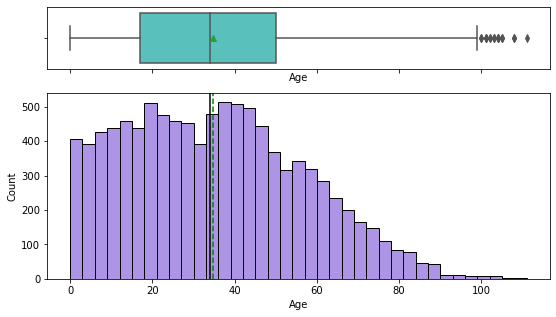

In [149]:
# Age Distribution
histogram_boxplot(data =CleanCensus_df, feature = 'Age')

- The distribution is skewed to the right, indicating that there are fewer older/elderly individuals represented in the dataset. 
- This skewness has an impact on the mean, which is slightly higher than the median due to the presence of outliers.

In [150]:
# Age reclassifcation
Census_df['Age group'] = Census_df['Age']
Census_df.loc[Census_df['Age'] <=17, 'Age group'] = 'Child'
Census_df.loc[(Census_df['Age'] >=18) & (Census_df['Age'] <65), 'Age group'] = 'Adult'
Census_df.loc[Census_df['Age'] >=65, 'Age group'] = 'Elderly'
Census_df['Age group'].value_counts()

Adult      6535
Child      2561
Elderly     987
Name: Age group, dtype: int64

In [151]:
# function to create labeled barplots

def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

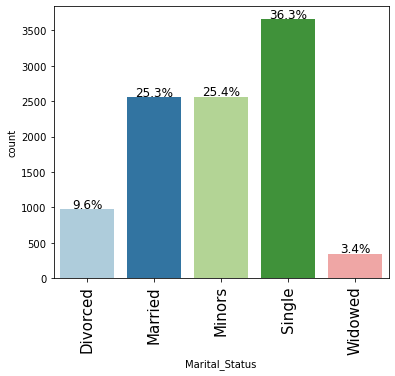

In [152]:
# plot of 'Marital Status'
labeled_barplot(data = CleanCensus_df, feature = 'Marital_Status', perc = True)

- The analysis indicates that a higher percentage of individuals, specifically 36.3%, are single, while 25.3% are married, 9.6% are divorced, and 3.4% are widowed. 
- Furthermore, a sizable portion of the population, accounting for 25.4%, comprises minors who are not of legal age to enter into marriage.

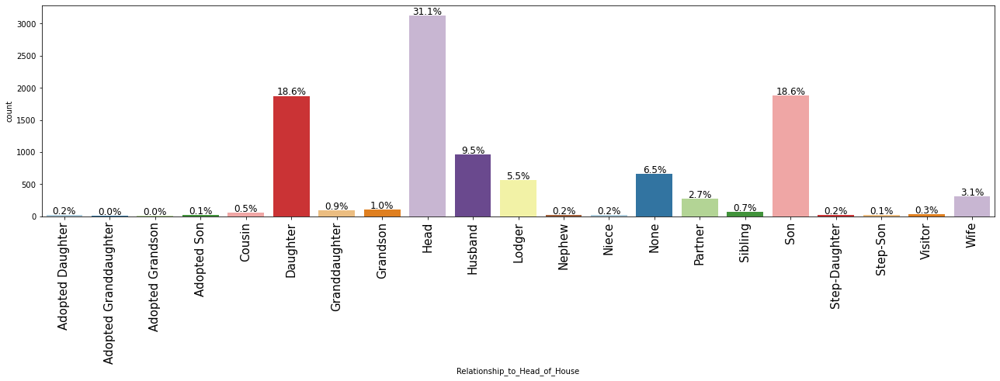

In [153]:
# plot of Relationship to the Head of House
labeled_barplot(data = CleanCensus_df, feature= 'Relationship_to_Head_of_House', perc = True)

In [154]:
CleanCensus_df['Infirmity'].unique()

array(['None', 'Physical Disability', 'Deaf', 'Unknown Infection',
       'Disabled', 'Blind', 'Mental Disability'], dtype=object)

In [155]:
# Reclassifying infirmity status to Disabled and Non_disabled
Census_df['Infirmity'] = Census_df['Infirmity'].replace(['Physical Disability', 'Deaf','Unknown Infection', 'Mental Disability', 'Blind', ], 'Disabled')
Census_df['Infirmity'] = Census_df['Infirmity'].replace(['None'], 'Non_Disabled')

In [156]:
#check for unique values again in infirmity after replacing
Census_df['Infirmity'].unique()

array(['Non_Disabled', 'Disabled'], dtype=object)

In [157]:
Census_df['Infirmity'].value_counts()

Non_Disabled    10008
Disabled           75
Name: Infirmity, dtype: int64

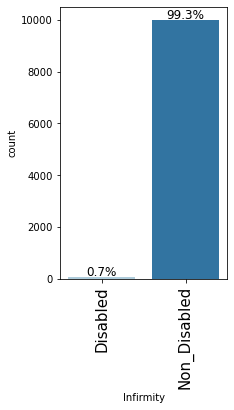

In [158]:
# Plot of Infirmity
labeled_barplot(data = Census_df, feature = 'Infirmity', perc = True)

- Observing the CleanCensus_df dataset, it is apparent that the majority of individuals are classified as Non_Disabled, indicating that they do not have any physical or mental impairments. 
- In contrast, only a small percentage, specifically 0.7%, of the population reports having a disability.

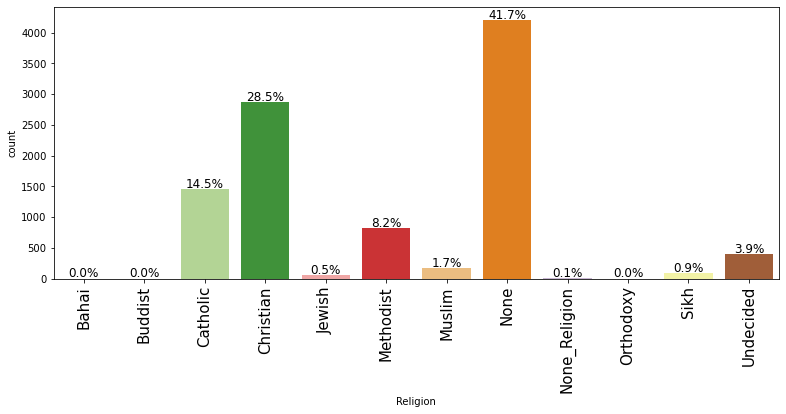

In [159]:
# Plot of Religion
labeled_barplot(data = Census_df, feature = 'Religion', perc = True)

- Based on the aforementioned data, it is evident that certain religions such as Buddhism, Baha'i, and Orthodoxy have vanished entirely, registering at 0.0%.
- Additionally, the Jewish and Sikh faiths may also face a similar fate in the future due to a lack of adherents. Furthermore, a significant portion of the population, or 41.7%, do not affiliate with any religion, while 3.9% remain undecided. 
- Among those who do identify with a religion, approximately 28.5% are Christians, with Catholics representing 14.5% and Methodists representing 8.2% of the population. 
- The Muslim population, on the other hand, accounts for only 1.7% of the total population.

In [160]:
#reclassifying Religion to Religious and Non-Religious
Census_df.loc[Census_df['Religion'] == 'None', 'Religion posit'] = False
Census_df.loc[Census_df['Religion'] != 'None', 'Religion posit'] = True

Census_df['Religion posit'] = Census_df['Religion posit'].replace([False], 'Non_religious')
Census_df['Religion posit'] = Census_df['Religion posit'].replace([True], 'Religious')
# To check for unique values in religion after recategorizing
Census_df['Religion posit'].unique()

array(['Religious', 'Non_religious'], dtype=object)

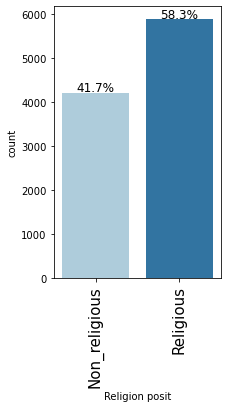

In [161]:
# Plot of Religious and Non_Religous 
labeled_barplot(data = Census_df, feature = 'Religion posit', perc = True)

- Despite the fact that certain religions have become extinct, and others are experiencing a gradual decline, it is noteworthy that a majority of the population, or 58.3%, continue to identify as religious.
- The remaining 41.7% of the population are classified as non-religious.

### Bivariate Analysis

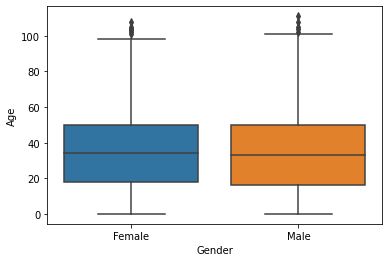

In [162]:
# Relationship between Age and Gender
sns.boxplot(x ='Gender' , y = 'Age', data = CleanCensus_df);

In [163]:
print(CleanCensus_df.Age.max(), " years")

111  years


- The mean age of males and females is nearly identical, indicating no significant difference between the two groups. - - -
- Additionally, the fact that the oldest individual in the population, who is 111 years old, is male can be inferred from the data.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Christian'),
  Text(1, 0, 'Muslim'),
  Text(2, 0, 'None'),
  Text(3, 0, 'Catholic'),
  Text(4, 0, 'Undecided'),
  Text(5, 0, 'Methodist'),
  Text(6, 0, 'Sikh'),
  Text(7, 0, 'Jewish'),
  Text(8, 0, 'None_Religion'),
  Text(9, 0, 'Buddist'),
  Text(10, 0, 'Bahai'),
  Text(11, 0, 'Orthodoxy')])

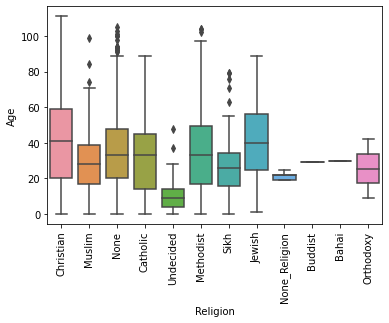

In [164]:
# Relationship between Age and Religion
sns.boxplot(x ='Religion' , y = 'Age', data = CleanCensus_df);
plt.xticks(rotation = 90)  # used to prevent overlapping

- The figure depicted above illustrates that the majority of the elderly population, including the oldest man, identify as Christians, with the None category and Methodists following behind in prevalence.
- Conversely, it was noted that a significant proportion of the younger demographic did not indicate their religious affiliation, potentially due to uncertainty or indecision.

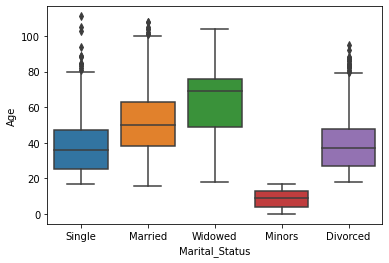

In [165]:
# Relationship between Age and Marital Status
sns.boxplot(x ='Marital_Status' , y = 'Age', data = CleanCensus_df);

- On average, the widowed population tends to be older than those who are single, married, divorced, or minors. 
- Furthermore, the minimum age of individuals who are single or married is 25 years and 40 years, respectively, whereas the minimum age for the widowed and divorced categories is approximately 50 years and 28 years, respectively.

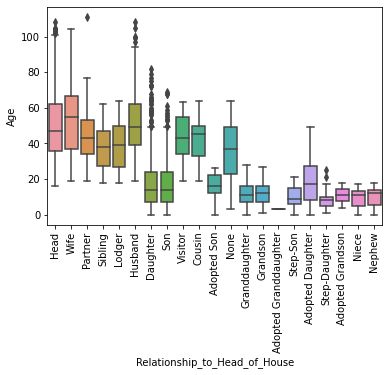

In [166]:
# Relationship between Age and the Relationship to the Head of House
sns.boxplot(x ='Relationship_to_Head_of_House' , y = 'Age', data = CleanCensus_df);
plt.xticks(rotation = 90);

In [167]:
CleanCensus_df['Age'].unique()

array([ 50,  21,  58,  79,  62,  63,  35,  29,  45,  43,  54,  44,  52,
        17,  16,  14,   8,  23,   1,  24,  38,  40,  41,   5,   2,  12,
         9,  61,  26,  53,  42,  15,  13,  51,  22,  27,  49,  55,  18,
        25,  19,  20,  34,  47,  39,  37,  30,  65,  70,  32,  28,  59,
        57,  48,  10,   0,  71,  31,  11,  36,   4,  46,  60,   3,  56,
        69,  72,  68,  67,  89,  91,  64,  76,  74,  81,  78,  83,  80,
        73,  75,  33, 102,  66,   7,   6,  94,  82,  84,  77,  85,  86,
        87,  88, 101, 104,  98, 100, 105,  92,  95, 103, 108,  90,  97,
        99,  93,  96, 111], dtype=int64)

### Population Pyramid

In [168]:
# Apply the categories to males population
cat = [start for start in range(0, CleanCensus_df.Age.max(), 5)]
males = pd.cut(CleanCensus_df.Age[CleanCensus_df.Gender=='Male'], cat).value_counts(sort=False) * -1

In [169]:
# Apply the categories to females population 
females = pd.cut(CleanCensus_df.Age[CleanCensus_df.Gender=='Female'], cat).value_counts(sort=False) 

In [170]:
# To sort the Gender based on the index values of the data
males.sort_index(ascending=False, inplace=True)
females.sort_index(ascending=False, inplace=True)

In [171]:
# Converting data type for ease of plotting
males.index = males.index.astype(str)
females.index = females.index.astype(str)

[Text(0.5, 0, '<--- Males   |   Population   |   Females --->'),
 Text(0, 0.5, 'Age-Group'),
 Text(0.5, 1.0, 'Population Pyramid')]

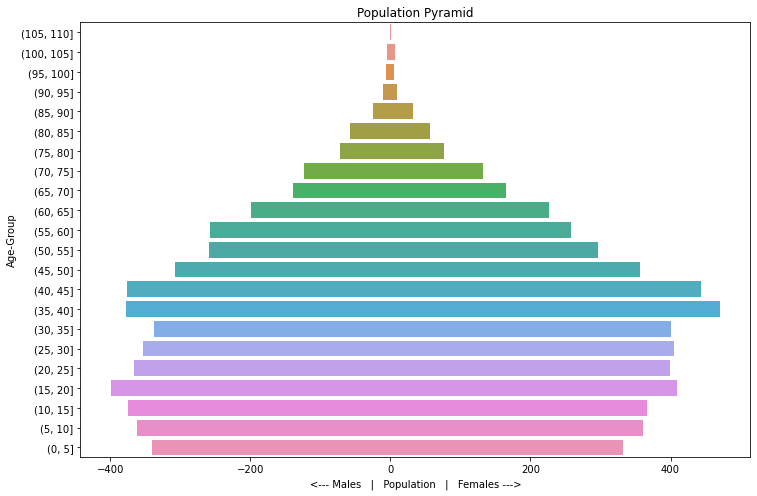

In [172]:
plt.figure(figsize=(12, 8))
plot = sns.barplot(data=males.reset_index(), x='Age', y='index', lw=0)
plot = sns.barplot(data=females.reset_index(), x='Age', y='index', lw=0)
plot.set(xlabel="<--- Males   |   Population   |   Females --->", ylabel="Age-Group", title = "Population Pyramid")


### For Commuters

In [173]:
df_commuters = CleanCensus_df

In [174]:
occupations = df_commuters.Occupation.value_counts().index
occupations

Index(['Student', 'Retired', 'Unemployed', 'University Student', 'Child',
       'Engineer', 'Scientist', 'Teacher', 'Surveyor', 'Consultant',
       ...
       'Psychologist, educational', 'Health service manager', 'Art therapist',
       'Psychologist, sport and exercise', 'Naval architect',
       'Corporate treasurer', 'Charity officer', 'Magazine journalist',
       'No_Occupation', 'Geologist, wellsite'],
      dtype='object', length=566)

In [175]:
df_commuters.Occupation.replace(occupations[5:], 'Commuters', inplace=True)
df_commuters.Occupation.replace('University Student', 'Commuters', inplace=True)

        index  Occupation
0   Commuters        5983
1     Student        2040
2     Retired         753
3  Unemployed         660
4       Child         647


<AxesSubplot:xlabel='index', ylabel='Occupation'>

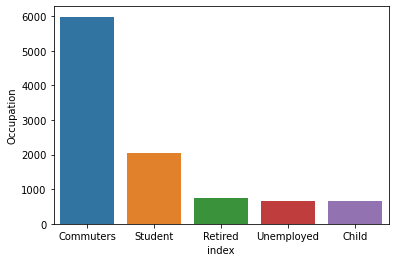

In [176]:
print(df_commuters.Occupation.value_counts().reset_index())
sns.barplot(data=df_commuters.Occupation.value_counts().reset_index(), x='index', y='Occupation')

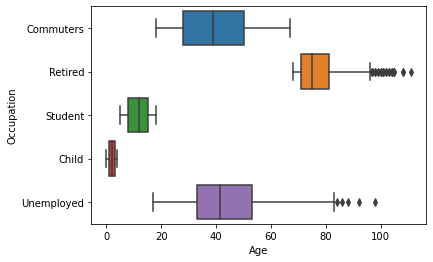

In [177]:
sns.boxplot(x=CleanCensus_df.Age, y=CleanCensus_df['Occupation'])
plt.show()

### Employment Trends

In [178]:
# Value count of individuals in the 'Unemployed' occupation category
Num_Unemployed = CleanCensus_df.Occupation.where(CleanCensus_df.Occupation=='Unemployed').value_counts()['Unemployed']
print(f"The proportion of individuals who are unemployed is {Num_Unemployed/CleanCensus_df.shape[0] * 100:.2f}%")

The proportion of individuals who are unemployed is 6.55%


In [179]:
# to determine the % employed and Unemployed
temp_df = CleanCensus_df.copy()
temp_df.loc[temp_df.Occupation.str.lower().str.contains('retired'), 'Occupation'] = 'Retired'

other_occup = temp_df.Occupation.unique().tolist()
other_occup.remove('Unemployed')

employment_stat = temp_df.Occupation.replace(other_occup, 'Employed')
employment_stat = employment_stat.value_counts(normalize=True)
employment_stat.map('{:.2%}'.format)

Employed      93.45%
Unemployed     6.55%
Name: Occupation, dtype: object

In [180]:
employment_stat.reset_index().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       2 non-null      object 
 1   Occupation  2 non-null      float64
dtypes: float64(1), object(1)
memory usage: 160.0+ bytes


<AxesSubplot:ylabel='Occupation'>

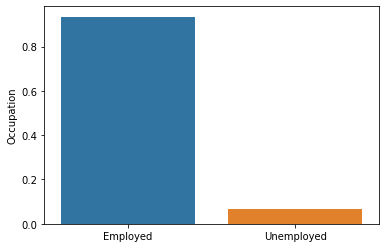

In [181]:
sns.barplot(y=employment_stat, x=employment_stat.index)

### Dependency ratio

Dependency ratio is – (the number of people aged between 0 and 14 + the number of people aged 64 and above) divide by the total population between 15 and 60, times by 100

In [182]:
bins = list(range(0,110, 5))
CleanCensus_df["age_cat"] = pd.cut(CleanCensus_df.Age, bins=bins,
                      labels=["0-5","5-10","10-15","15-20","20-25","25-30","30-35",
                              "35-40","40-45","45-50","50-55","55-60","60-65","65-70","70-75",
                             "75-80","80-85","85-90","90-95","95-100","100-105"], right=True)

In [183]:
CleanCensus_df.head(7)

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion,age_cat
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Commuters,None,Christian,45-50
1,2,Gray Centers,Amber,James,21,Head,Single,Female,Commuters,None,Muslim,20-25
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Commuters,None,Christian,55-60
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,Commuters,None,None,45-50
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired,None,Christian,75-80
5,5,Gray Centers,Anna,Edwards,62,Head,Single,Female,Commuters,None,Christian,60-65
6,5,Gray Centers,Terry,Holt,63,Partner,Single,Male,Commuters,None,Christian,60-65


In [184]:
male_grp = CleanCensus_df[CleanCensus_df["Gender"] == "Male"]
female_grp = CleanCensus_df[CleanCensus_df["Gender"] == "Female"]

no_females_age = female_grp.groupby("age_cat")["Age"].count()
no_males_age = male_grp.groupby("age_cat")["Age"].count()

In [185]:
(pd.Series(no_females_age, index=None))

age_cat
0-5        332
5-10       361
10-15      367
15-20      409
20-25      399
25-30      405
30-35      400
35-40      470
40-45      443
45-50      356
50-55      296
55-60      258
60-65      227
65-70      165
70-75      132
75-80       76
80-85       57
85-90       33
90-95        9
95-100       5
100-105      7
Name: Age, dtype: int64

In [186]:
c_Age = [0-5,5-10,10-15,15-20,20-25,25-30,30-35,35-40,40-45,45-50,50-55,55-60,60-65,65-70,70-75,75-80,80-85,85-90,90-95,95-100,100-105 ]

no_Female = [256,268,339,371,362,359,393,421,395,337,298,265,196,155,118,103,69,25,5,2,8]

In [187]:
CleanCensus_df.groupby('age_cat')["Age"].count()

age_cat
0-5        672
5-10       723
10-15      742
15-20      808
20-25      765
25-30      758
30-35      737
35-40      847
40-45      819
45-50      663
50-55      555
55-60      515
60-65      426
65-70      304
70-75      256
75-80      148
80-85      114
85-90       58
90-95       20
95-100      11
100-105     12
Name: Age, dtype: int64

In [188]:
# youth_dep = age category 0 - 15
Youth_Dep = 498 + 579 + 659

# elderly dependents above 65
Elderly_Dep = 300+228+193+134+52+10+7+11

print(f"The Total number of Youth Dependents is: {Youth_Dep}")
print(f"The Total number of Elderly Dependents is: {Elderly_Dep}")

The Total number of Youth Dependents is: 1736
The Total number of Elderly Dependents is: 935


In [189]:
# Total population between 15 and 64
Dependent_Pop = Youth_Dep + Elderly_Dep
Independent_Pop = CleanCensus_df.shape[0] - (Dependent_Pop)
Independent_Pop

7412

In [190]:
# Dependency Ratio 
Dependency_Ratio = (Dependent_Pop / Independent_Pop)
Dependency_Ratio_Percent = np.ceil((Dependent_Pop / Independent_Pop) * 100)
print(Dependency_Ratio_Percent,'%')

37.0 %


<AxesSubplot:>

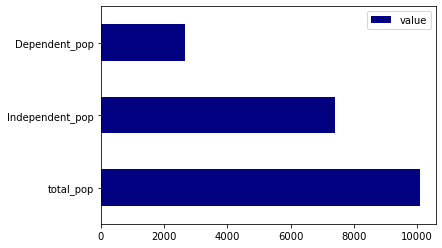

In [191]:
# Dependency Ratio Chart 
pd.DataFrame({'item': ['total_pop','Independent_Pop', 'Dependent_Pop'],
             'value': [CleanCensus_df.shape[0], Independent_Pop, Dependent_Pop]},
             index=['total_pop','Independent_pop', 'Dependent_pop']).plot(kind='barh', color='navy')

## Occupancy Level and Density

In [192]:
# In other to get unique house address and get the number of occupants in each house, the two columns (House Number and Street) will be merged.
CleanCensus_df['House Address'] = CleanCensus_df['House_Number'].astype(str) +' ' + CleanCensus_df['Street']

In [193]:
# Count of unique household
len((CleanCensus_df['House Address']).unique())

3105

In [194]:
(CleanCensus_df["House Address"].value_counts()).mean() #average occupancy is aaproximately 3

3.247342995169082

In [195]:
# under occupied houses
(CleanCensus_df["House Address"].value_counts()<5).sum()

2362

In [196]:
# % of under occupied houses
(2362/3105)*100

76.0708534621578

In [197]:
# overcrowded houses
(CleanCensus_df["House Address"].value_counts()>5).sum()

256

In [198]:
# % of overcrowded houses
(256/3105)*100

8.244766505636072

In [199]:
# houses that are extremely under occupied
(CleanCensus_df["House Address"].value_counts()<=2).sum()


1494

In [200]:
# % of houses that are extremely under occupied
(1494/3105)*100

48.11594202898551

In [201]:
# extremely over occupied houses
(CleanCensus_df["House Address"].value_counts()>=7).sum()

181

In [202]:
# houses whose occupants that are equal to 5
(CleanCensus_df["House Address"].value_counts()==5).sum()

487

In [203]:
# household with minors less than 3
minor_OC = CleanCensus_df[CleanCensus_df['Marital_Status']=='Minor']
(minor_OC["House Address"].value_counts()<3).sum()

0

In [204]:
#household with minors less than 3
minor_OC = CleanCensus_df[CleanCensus_df['Marital_Status']=='Minor']
(minor_OC["House Address"].value_counts()>3).sum()

0

In [205]:
# Occupancy level
CleanCensus_df.groupby(['House Address'],sort=False)['House Address'].count().sort_values(ascending=False).tail(1000)

House Address
7 Fish Stravenue             2
3 Fish Stravenue             2
13 Sydney Street             2
31 Jones Street              2
10 Sydney Street             2
3 Sydney Street              2
34 Jones Street              2
35 Hawthorn Knolls           2
34 Hawthorn Knolls           2
32 Hawthorn Knolls           2
39 Fish Stravenue            2
43 Fish Stravenue            2
44 Fish Stravenue            2
48 Lavendar Hollow           2
23 Warren Bypass             2
21 Warren Bypass             2
18 Warren Bypass             2
17 Warren Bypass             2
16 Warren Bypass             2
14 Warren Bypass             2
11 Warren Bypass             2
47 Fish Stravenue            2
10 Warren Bypass             2
8 Warren Bypass              2
7 Warren Bypass              2
1 Warren Bypass              2
55 Fish Stravenue            2
1 Jones Street               2
31 Hawthorn Knolls           2
24 Hawthorn Knolls           2
141 Andrews Avenue           2
23 Hawthorn Knolls       

In [206]:
# to Check
CleanCensus_df[CleanCensus_df['House Address']=='7 Fish Stravenue']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion,age_cat,House Address
883,7,Fish Stravenue,Jade,Smith,69,Head,Married,Female,Retired,None,Christian,65-70,7 Fish Stravenue
884,7,Fish Stravenue,Iain,Smith,71,Husband,Married,Male,Retired,None,Christian,70-75,7 Fish Stravenue


In [207]:
CleanCensus_df[CleanCensus_df['House Address']=='1 Bishop Granary']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion,age_cat,House Address
10082,1,Bishop Granary,Rhys,Baxter,23,Head,Single,Male,Unemployed,None,None,20-25,1 Bishop Granary


In [208]:
CleanCensus_df[CleanCensus_df['House Address']=='10 Sydney Street']

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion,age_cat,House Address
853,10,Sydney Street,Lydia,Sheppard,47,Head,Single,Female,Commuters,None,Catholic,45-50,10 Sydney Street
854,10,Sydney Street,Clare,Sheppard,11,Daughter,Minors,Female,Student,None,Catholic,10-15,10 Sydney Street


In [209]:
occupancy= CleanCensus_df[['House Address']].value_counts()
df_occupancy =pd.DataFrame(occupancy)
df_occupancy = df_occupancy.rename(columns={0: "Occupants"}).reset_index()
df_occupancy['Marital_Status'] = CleanCensus_df['Marital_Status']
df_occupancy

,House Address,Occupants,Marital_Status
0,35 Lightning Street,22,Single
1,56 Lightning Street,22,Single
2,6 Daffodil Avenue,22,Married
3,131 Shepherd Cove,22,Married
4,1 Burgess Obervatory,21,Widowed
5,81 Lightning Street,21,Single
6,124 Lightning Street,20,Single
7,18 Shepherd Cove,20,Single
8,89 Lightning Street,19,Single
9,203 Lightning Street,19,Single


In [210]:
CleanCensus_df["Occupants"] = df_occupancy['Occupants']

In [211]:
df_widowed = CleanCensus_df[CleanCensus_df['Marital_Status']=='Widowed']
df_divorced =CleanCensus_df[CleanCensus_df['Marital_Status']=='Divorced']
df_Married = CleanCensus_df[CleanCensus_df['Marital_Status']=='Married']
df_Single = CleanCensus_df[CleanCensus_df['Marital_Status']=='Single']

<Figure size 720x360 with 0 Axes>

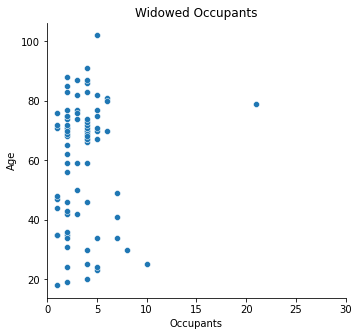

In [212]:
plt.figure(figsize=(10,5));
sns.relplot(data=df_widowed, y='Age', x='Occupants');
plt.title('Widowed Occupants');
plt.xlim(0, 30);

plt.subplots_adjust(top=0.88);
plt.savefig('Widowed Occupants');

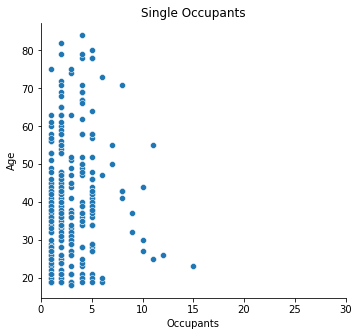

In [213]:
sns.relplot(data=df_divorced, y='Age', x='Occupants');
plt.title('Single Occupants');
plt.xlim(0, 30);

plt.subplots_adjust(top=0.88)
plt.savefig('Single Occupants')

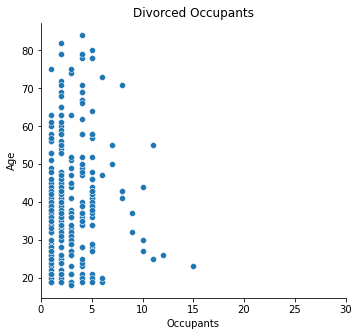

In [214]:
sns.relplot(data=df_divorced, y='Age', x='Occupants');
plt.title('Divorced Occupants');
plt.xlim(0, 30);

plt.subplots_adjust(top=0.88)
plt.savefig('Divorced Occupants')

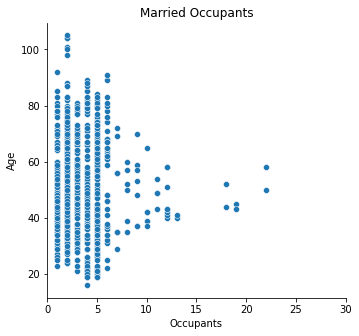

In [215]:
sns.relplot(data=df_Married, y='Age', x='Occupants');
plt.title('Married Occupants');

plt.subplots_adjust(top=0.88)
plt.savefig('Married Occupants')
plt.xlim(0, 30);

## Birth and Death Rate

In [216]:
# Assigning babies less than a year old to a variable
zero_years = len(CleanCensus_df.query('`Age`== 0'))

In [217]:
# checking the number of children aged '0'
CleanCensus_df.query('`Age`== 0')

,House_Number,Street,First_Name,Surname,Age,Relationship_to_Head_of_House,Marital_Status,Gender,Occupation,Infirmity,Religion,age_cat,House Address,Occupants
116,26,Bletchleyrow Street,Oliver,Clark,0,Adopted Son,Minors,Male,Child,None,Undecided,NaN,26 Bletchleyrow Street,8.0
127,30,Bletchleyrow Street,Frederick,Stephenson,0,Son,Minors,Male,Child,None,Undecided,NaN,30 Bletchleyrow Street,8.0
356,76,Andrews Avenue,Pauline,Lloyd,0,Daughter,Minors,Female,Child,None,None,NaN,76 Andrews Avenue,5.0
460,117,Andrews Avenue,Anthony,Nicholls,0,Son,Minors,Male,Child,None,Catholic,NaN,117 Andrews Avenue,5.0
498,132,Andrews Avenue,Karen,Gould,0,Daughter,Minors,Female,Child,None,Catholic,NaN,132 Andrews Avenue,5.0
529,145,Andrews Avenue,Lindsey,Clark,0,Daughter,Minors,Female,Child,None,Catholic,NaN,145 Andrews Avenue,5.0
544,149,Andrews Avenue,Charles,King,0,Son,Minors,Male,Child,None,Undecided,NaN,149 Andrews Avenue,5.0
699,4,Lynch Spurs,Marie,Moore,0,Daughter,Minors,Female,Child,None,Christian,NaN,4 Lynch Spurs,5.0
711,8,Lynch Spurs,Carl,Allen,0,Son,Minors,Male,Child,None,None,NaN,8 Lynch Spurs,5.0
712,8,Lynch Spurs,Georgina,Allen,0,Daughter,Minors,Female,Child,None,None,NaN,8 Lynch Spurs,5.0


###  Birth Rate 

In [218]:
#Birth Rate= births/ population *1000

In [219]:
zero_years = len(CleanCensus_df.query('`Age`== 0'))
five_years = len(CleanCensus_df.query('`Age`== 5'))
total_pop = len(CleanCensus_df)

In [220]:
cbr_zero =zero_years/ total_pop * 1000
cbr_five = five_years /total_pop * 1000
print(f'The recent birth rate per 1000 is,', float(cbr_zero))
print(f'The previous birth rate per 1000 for the last five years is,', float(cbr_five) )

The recent birth rate per 1000 is, 12.595457701081028
The previous birth rate per 1000 for the last five years is, 15.074878508380442


In [221]:
# checking the difference in the birth rate
diff_cbr = cbr_zero - cbr_five
print(f'The difference in the birth rate over the years is,', int(diff_cbr))

The difference in the birth rate over the years is, -2


- it can be seen that there is a decline in birth rate from the analysis above

### Death Rate 

In [222]:
len(CleanCensus_df.query("`Age`== '65-70'"))

0

In [223]:
# count=print(CleanCensus_df['age_cat']count=print(CleanCensus_df['age_cat'].value_counts()).value_counts()) 

count = CleanCensus_df['age_cat'].value_counts()
print(count)

35-40      847
40-45      819
15-20      808
20-25      765
25-30      758
10-15      742
30-35      737
5-10       723
0-5        672
45-50      663
50-55      555
55-60      515
60-65      426
65-70      304
70-75      256
75-80      148
80-85      114
85-90       58
90-95       20
100-105     12
95-100      11
Name: age_cat, dtype: int64


In [226]:
# Checking the population for age range '64-67' vs '68-71'
age_above64 = len(CleanCensus_df.query("`age_cat`== '64-67'"))
age_above68 = len(CleanCensus_df.query("`age_cat`== '68-71'"))
tot_above64_68 = age_above64 - age_above68 / 4
tot_above64_68

0.0

In [227]:
# Checking the population for age range '72-75' vs '76-79'
age_above72 = len(CleanCensus_df.query("`age_cat`== '72-75'"))
age_above76 = len(CleanCensus_df.query("`age_cat`== '76-79'"))
tot_above72_76 = age_above72 - age_above76 / 4
tot_above72_76

0.0

In [228]:
# Checking the population for age range '80-83' vs '84-87'
age_above80 = len(CleanCensus_df.query("`age_cat`== '80-83'"))
age_above84 = len(CleanCensus_df.query("`age_cat`== '84-87'"))
tot_above80_84 = age_above80 - age_above84 / 4
tot_above80_84

0.0

In [229]:
# Checking the total population
total_old_pop = tot_above64_68 +tot_above72_76 + tot_above80_84
total_pop = len(CleanCensus_df)
total_pop

10083

In [230]:
# Checking the crude death rate(no of deaths/total population per 1000)
death_rate = (total_old_pop / total_pop) *1000
print(f'The crude death rate per 1000 of the total population is, ', death_rate)

The crude death rate per 1000 of the total population is,  0.0


In [231]:
from pandas_profiling import ProfileReport
profile_report=ProfileReport(CleanCensus_df)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]